In [1]:
!pip install torch torchvision

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import torch

Introduction to Pytorch Tensors

In [3]:
#Tensors are generalizations of matrices with n-dimensions
v = torch.tensor([1,2,3,4,5,6], dtype=torch.float64)
print(v, v.dtype, v[:5])

tensor([1., 2., 3., 4., 5., 6.], dtype=torch.float64) torch.float64 tensor([1., 2., 3., 4., 5.], dtype=torch.float64)


In [4]:
#Reshaping the tensor
v.view(3,2)

tensor([[1., 2.],
        [3., 4.],
        [5., 6.]], dtype=torch.float64)

In [5]:
#Converting numpy arrays to torch tensors
a = np.array([1,2,3,4,5])
c = torch.from_numpy(a)
print(c)
c = c.numpy()
print(c)

tensor([1, 2, 3, 4, 5])
[1 2 3 4 5]


Sum: tensor([5., 7., 9.])
Difference: tensor([-3., -3., -3.])
Scalar multiplication: tensor([3., 6., 9.])
Element-wise product: tensor([ 4., 10., 18.])
Inner Product: tensor(32.)
Linspace 1: tensor([1.0000, 2.3333, 3.6667, 5.0000])


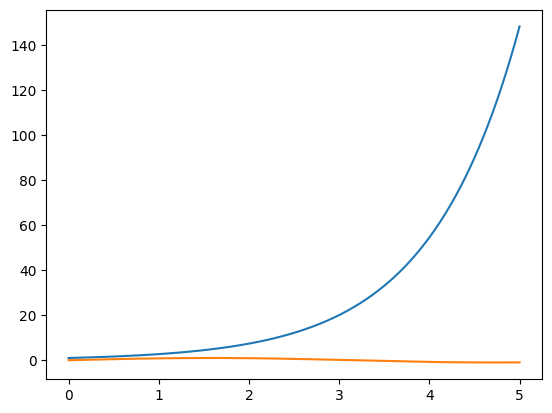

In [6]:
t1 = torch.tensor([1,2,3], dtype=torch.float)
t2 = torch.tensor([4,5,6], dtype=torch.float)
#Operations
print("Sum:", t1+t2)
print("Difference:", t1-t2)
print("Scalar multiplication:", 3*t1)
print("Element-wise product:", t1*t2)
print("Inner Product:", torch.dot(t1,t2))
#Generating linspaces
print("Linspace 1:", torch.linspace(1,5,4))
plt.plot(torch.linspace(0,5,1000).numpy(), torch.exp(torch.linspace(0,5,1000)).numpy())
plt.plot(torch.linspace(0,5,1000).numpy(), torch.sin(torch.linspace(0,5,1000)).numpy())

In [7]:
#Multi-dimensional Tensors
one_d = torch.arange(0,9)
print(one_d)
two_d = one_d.view(3,3)
print(two_d)
three_d = torch.arange(0,18).view(3,3,2)
print(three_d)
#Getting the number 10
print(three_d[1,2,0])
#Slicing
print(three_d[1,:,0])

tensor([0, 1, 2, 3, 4, 5, 6, 7, 8])
tensor([[0, 1, 2],
        [3, 4, 5],
        [6, 7, 8]])
tensor([[[ 0,  1],
         [ 2,  3],
         [ 4,  5]],

        [[ 6,  7],
         [ 8,  9],
         [10, 11]],

        [[12, 13],
         [14, 15],
         [16, 17]]])
tensor(10)
tensor([ 6,  8, 10])


In [8]:
#Matrix multiplication
a = torch.arange(0,6, dtype=torch.float).view(2,3)
b = torch.arange(0,6, dtype=torch.float).view(3,2)
print(a)
print(b)
print(torch.matmul(a,b))
print(a@b)

tensor([[0., 1., 2.],
        [3., 4., 5.]])
tensor([[0., 1.],
        [2., 3.],
        [4., 5.]])
tensor([[10., 13.],
        [28., 40.]])
tensor([[10., 13.],
        [28., 40.]])


In [9]:
#Differentiation
x = torch.tensor(2.0, requires_grad=True)
y = 9*x**4 + 2*x**3 + 3*x**2 + 6*x + 1
y.backward()
print("Derivative at x=2.0:", x.grad)

#Partial derivative
x = torch.tensor(1.0, requires_grad=True)
z = torch.tensor(2.0, requires_grad=True)
y = x**2+z**3
y.backward()
print("Partial derivative w.r.t x:", x.grad)
print("Partial derivative w.r.t z:", z.grad)

Derivative at x=2.0: tensor(330.)
Partial derivative w.r.t x: tensor(2.)
Partial derivative w.r.t z: tensor(12.)


Building a classifier (single perceptron)

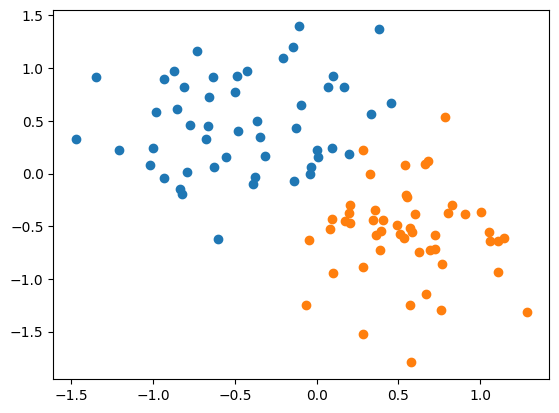

In [22]:
from sklearn import datasets
n_pt = 100
centers = [[-0.5,0.5], [0.5,-0.5]]
#This function creates a cluster of random points centered around the given center
X, y = datasets.make_blobs(n_samples=n_pt, random_state=123, centers=centers, cluster_std=0.4)
plt.scatter(X[y==0, 0], X[y==0, 1])
plt.scatter(X[y==1, 0], X[y==1, 1])

In [23]:
X_data = torch.Tensor(X)
y_data = torch.Tensor(y.reshape(100,1))
print(X_data.dtype)
print(y_data.dtype)

torch.float32
torch.float32


In [24]:
class Model(nn.Module):
  def __init__(self, input_size, output_size):
    super().__init__()
    self.linear = nn.Linear(in_features=input_size, out_features=output_size)
  def forward(self, x):
    return torch.sigmoid(self.linear(x))

In [25]:
model = Model(2,1)
criteria = nn.BCELoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.01)

Epchs: 1/1000 | Loss: 0.9955193996429443
Epchs: 101/1000 | Loss: 0.8020390272140503
Epchs: 201/1000 | Loss: 0.6610633134841919
Epchs: 301/1000 | Loss: 0.5597128868103027
Epchs: 401/1000 | Loss: 0.48606231808662415
Epchs: 501/1000 | Loss: 0.43124744296073914
Epchs: 601/1000 | Loss: 0.38929957151412964
Epchs: 701/1000 | Loss: 0.3563222885131836
Epchs: 801/1000 | Loss: 0.32976382970809937
Epchs: 901/1000 | Loss: 0.30792149901390076


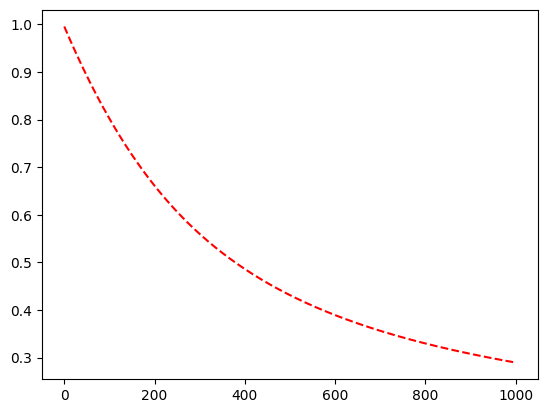

In [26]:
epochs = 1000
losses = []
for i in range(epochs):
  #Getting the output
  preds = model(X_data)
  #Calculating the loss
  loss = criteria(preds, y_data)
  #Setting the gradient to zero
  optimizer.zero_grad()
  #Calculating the gradients
  loss.backward()
  #Updating the parameters
  optimizer.step()
  losses.append(loss.item())
  if(i%100==0):
    print(f"Epchs: {i+1}/{epochs} | Loss: {loss.item()}")
plt.plot(losses, 'r--')

In [27]:
preds = model(X_data).detach().numpy()
y = y.reshape(100,1)
preds = np.where(preds<0.5, 0, 1)
print(np.sum(preds==y)*100/len(y))

99.0


Training a deep learning network

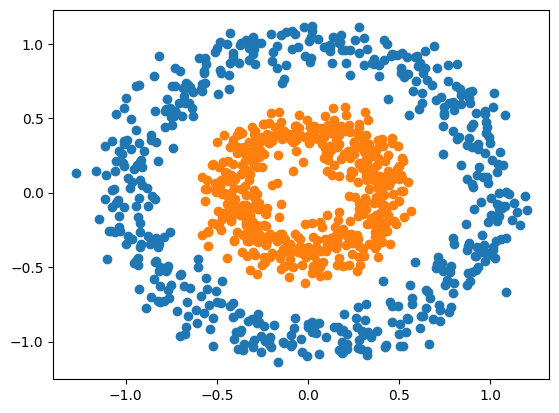

In [28]:
from sklearn import datasets
n_pt = 1000
#This function creates a cluster of random points centered around the given center
X, y = datasets.make_circles(n_samples=n_pt, random_state=123, noise=0.1, factor=0.4)
plt.scatter(X[y==0, 0], X[y==0, 1])
plt.scatter(X[y==1, 0], X[y==1, 1])

In [29]:
X_data = torch.Tensor(X)
y_data = torch.Tensor(y.reshape(1000,1))

In [30]:
class DNN_model(nn.Module):
  def __init__(self, input_size, output_size):
    super().__init__()
    self.ip_layer = nn.Linear(input_size,5)
    self.h1 = nn.Linear(5,3)
    self.h2 = nn.Linear(3,output_size)
  def forward(self, x):
    x = torch.sigmoid(self.ip_layer(x))
    x = torch.sigmoid(self.h1(x))
    x = torch.sigmoid(self.h2(x))
    return x
  def predict(self, x):
    pred = self.forward(x)
    if(pred>=0.5):
      return 1
    return 0

In [31]:
model = DNN_model(2,1)
print(list(model.parameters()))

[Parameter containing:
tensor([[-0.5611, -0.5808],
        [-0.0619,  0.2970],
        [-0.0205, -0.3586],
        [ 0.0162, -0.6646],
        [-0.4998, -0.4707]], requires_grad=True), Parameter containing:
tensor([ 0.5823,  0.6233, -0.2402,  0.0317,  0.3154], requires_grad=True), Parameter containing:
tensor([[ 0.0536, -0.2239,  0.2579,  0.2749, -0.0259],
        [-0.0551,  0.4064,  0.3909, -0.2536,  0.4375],
        [ 0.1107, -0.2971,  0.2448, -0.3339,  0.4132]], requires_grad=True), Parameter containing:
tensor([-0.2875,  0.1265,  0.1362], requires_grad=True), Parameter containing:
tensor([[ 0.1373,  0.4789, -0.2398]], requires_grad=True), Parameter containing:
tensor([-0.2437], requires_grad=True)]


In [32]:
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.1)

Epochs: 1/100 | Loss: 0.6931363940238953
Epochs: 11/100 | Loss: 0.6930713057518005
Epochs: 21/100 | Loss: 0.6837316751480103
Epochs: 31/100 | Loss: 0.6374854445457458
Epochs: 41/100 | Loss: 0.49312520027160645
Epochs: 51/100 | Loss: 0.23876447975635529
Epochs: 61/100 | Loss: 0.09222470968961716
Epochs: 71/100 | Loss: 0.04041506350040436
Epochs: 81/100 | Loss: 0.022970739752054214
Epochs: 91/100 | Loss: 0.016833627596497536


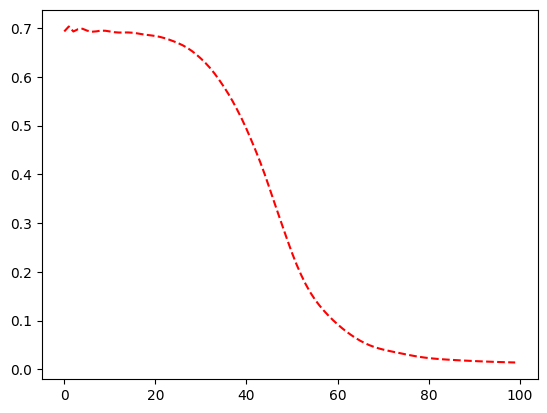

In [33]:
epochs = 100
losses = []
for i in range(epochs):
  preds = model(X_data)
  loss = criterion(preds, y_data)
  #Setting the gradient to zero
  optimizer.zero_grad()
  #Calculating the new gradient
  loss.backward()
  #Updating the model paramters
  optimizer.step()
  #Noting the loss
  losses.append(loss.item())
  if(i%10==0):
    print(f"Epochs: {i+1}/{epochs} | Loss: {loss.item()}")
plt.plot(losses, 'r--')

In [34]:
preds = model(X_data).detach().numpy()
y = y.reshape(1000,1)
preds = np.where(preds<0.5, 0, 1)
print(np.sum(preds==y)*100/len(y))

99.5


In [35]:
def plot_decision_boundary(X, y):
  x_span = np.linspace(min(X[:,0]), max(X[:,0]))
  y_span = np.linspace(min(X[:,1]), max(X[:,1]))
  #Creating a grid
  xx, yy = np.meshgrid(x_span, y_span)
  #Turning it one-dimensional
  grid = torch.Tensor(np.c_[xx.ravel(), yy.ravel()])
  pred_func = model.forward(grid)
  z = pred_func.view(xx.shape).detach().numpy()
  plt.contourf(xx, yy, z)

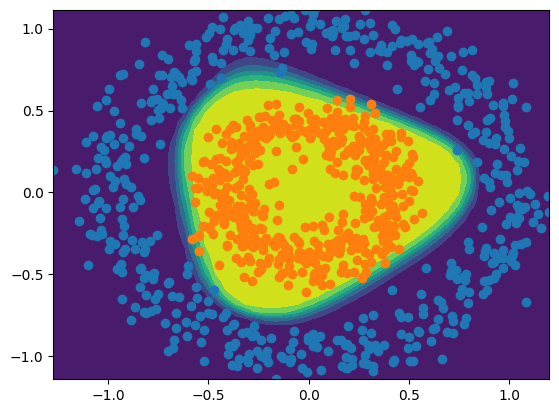

In [36]:
plot_decision_boundary(X, y)
X, y = datasets.make_circles(n_samples=n_pt, random_state=123, noise=0.1, factor=0.4)
plt.scatter(X[y==0, 0], X[y==0, 1])
plt.scatter(X[y==1, 0], X[y==1, 1])

In [37]:
from torchvision import datasets, transforms
#Clubs together all the transforms to be applied on the image.
transform = transforms.Compose([transforms.ToTensor(),
                                transforms.Normalize((0.5,), (0.5))])
training_dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transform)
#Defining a training loader
training_loader = torch.utils.data.DataLoader(dataset=training_dataset, batch_size=128, shuffle=True)

100%|██████████| 9912422/9912422 [00:00<00:00, 110498173.44it/s]


Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 105795365.79it/s]


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 35809142.95it/s]


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 6175211.92it/s]


Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



In [38]:
print(len(training_loader))

469


In [39]:
def image_convert(tns):
  #Creating a image
  image = tns.clone().detach().numpy()
  #Rearranging axis. This gives the shape 28x28x1
  image = image.transpose(1,2,0)
  #Denormalizing
  image = image*np.array((0.5,0.5,0.5)) + np.array((0.5,0.5,0.5))
  image = image.clip(0,1)
  return image

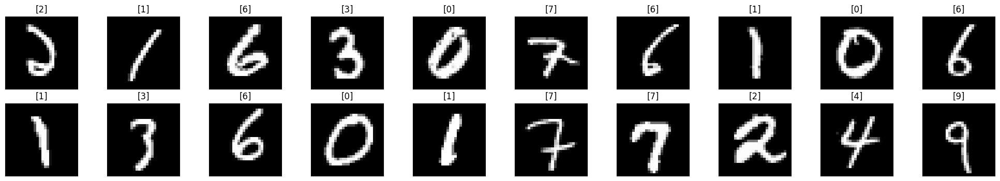

In [40]:
dataiter = iter(training_loader)
images, labels = next(dataiter)
fig = plt.figure(figsize=(25,4))

for i in range(20):
  ax = fig.add_subplot(2, 10, i+1, xticks=[], yticks=[])
  plt.imshow(image_convert(images[i]))
  ax.set_title([labels[i].item()])

In [41]:
import torch.nn.functional as F
class Classifier(nn.Module):
  def __init__(self, D_in, H1, H2, D_out):
    super().__init__()
    self.l1 = nn.Linear(in_features=D_in, out_features=H1)
    self.h1 = nn.Linear(in_features=H1, out_features=H2)
    self.op = nn.Linear(in_features=H2, out_features=D_out)
  def forward(self, x):
    x = F.relu(self.l1(x))
    x = F.relu(self.h1(x))
    x = self.op(x)
    return x

In [42]:
model = Classifier(784, 125, 65, 10)
model

Classifier(
  (l1): Linear(in_features=784, out_features=125, bias=True)
  (h1): Linear(in_features=125, out_features=65, bias=True)
  (op): Linear(in_features=65, out_features=10, bias=True)
)

In [43]:
criteria = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [44]:
valid_dataset = datasets.MNIST(root='./data', train=False, download=True, transform=transform)
valid_loader = torch.utils.data.DataLoader(valid_dataset, batch_size=128, shuffle=False)

In [45]:
epochs = 15
running_losses = []
running_accuracy = []
val_losses = []
val_accs = []
for epoch in range(epochs):
  total_samples = 0
  running_loss = 0.0
  val_running_loss = 0.0
  val_corr = 0.0
  val_total_samples=0.0
  num_corr = 0.0
  for images, labels in training_loader:
    #Flattening the images
    images = images.view(images.shape[0], -1)
    #Computing the model's output
    outputs = model(images)
    #Defining the loss
    loss = criteria(outputs, labels)
    #Setting the grad to zero
    optimizer.zero_grad()
    #Computing gradients
    loss.backward()
    #Updating parameters
    optimizer.step()
    #Computing the accuracy. torch.max() returns the max_values, indices
    _, preds = torch.max(outputs,1)
    num_corr += (preds == labels.data).sum().item()
    total_samples += labels.size(0)
    #Storing the loss
    running_loss+=loss.item()
  #Storing the loss
  rl = running_loss/len(training_loader)
  ac = 100*num_corr/total_samples
  running_losses.append(rl)
  running_accuracy.append(ac)
  with torch.no_grad():
    for val_images, val_labels in valid_loader:
      #Flattening the images
      val_images = val_images.view(val_images.shape[0], -1)
      #Computing the model's output
      val_outputs = model(val_images)
      #Defining the loss
      val_loss = criteria(val_outputs, val_labels)
      val_running_loss+=val_loss.item()
      _, val_preds = torch.max(val_outputs,1)
      val_corr += (val_preds == val_labels.data).sum().item()
      val_total_samples += val_labels.size(0)
    val_rl = val_running_loss/len(valid_loader)
    val_acc = 100*(val_corr/val_total_samples)
    val_losses.append(val_rl)
    val_accs.append(val_acc)
  if(epoch%1==0):
    print(f"Epoch: {epoch+1}/{epochs} | Training Loss: {rl:.5f} | Valid Loss: {val_rl:.5f} | Training Accuracy: {ac:.4f}% | Validation Accuracy: {val_acc:.4f}%")

Epoch: 1/15 | Training Loss: 0.46031 | Valid Loss: 0.27501 | Training Accuracy: 86.4800% | Validation Accuracy: 91.6400%
Epoch: 2/15 | Training Loss: 0.23104 | Valid Loss: 0.18613 | Training Accuracy: 93.2033% | Validation Accuracy: 94.3500%
Epoch: 3/15 | Training Loss: 0.16735 | Valid Loss: 0.14565 | Training Accuracy: 94.9633% | Validation Accuracy: 95.4600%
Epoch: 4/15 | Training Loss: 0.13241 | Valid Loss: 0.12609 | Training Accuracy: 95.9800% | Validation Accuracy: 96.1200%
Epoch: 5/15 | Training Loss: 0.11248 | Valid Loss: 0.12058 | Training Accuracy: 96.6117% | Validation Accuracy: 96.1600%
Epoch: 6/15 | Training Loss: 0.09709 | Valid Loss: 0.09562 | Training Accuracy: 97.0483% | Validation Accuracy: 97.1100%
Epoch: 7/15 | Training Loss: 0.08150 | Valid Loss: 0.09310 | Training Accuracy: 97.4683% | Validation Accuracy: 97.0700%
Epoch: 8/15 | Training Loss: 0.07547 | Valid Loss: 0.10446 | Training Accuracy: 97.6717% | Validation Accuracy: 96.7600%
Epoch: 9/15 | Training Loss: 0.0

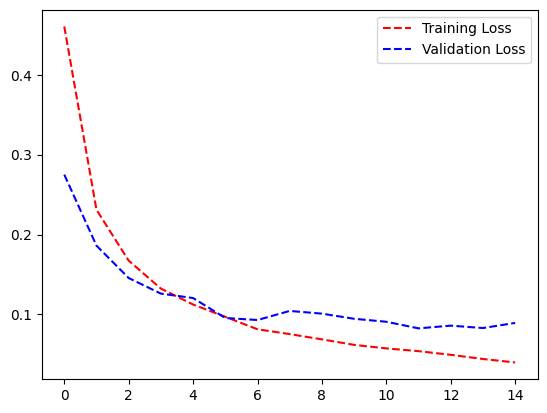

In [46]:
plt.plot(running_losses, 'r--', label="Training Loss")
plt.plot(val_losses, 'b--', label="Validation Loss")
plt.legend()

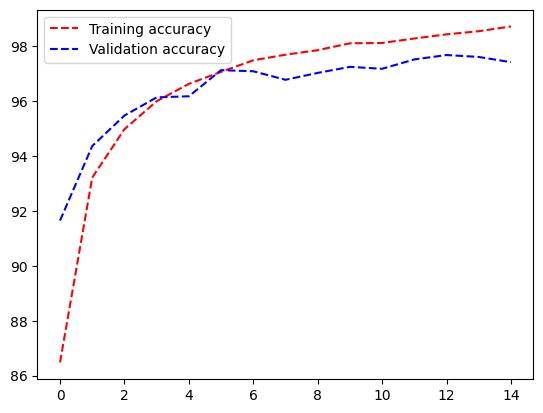

In [47]:
plt.plot(running_accuracy, 'r--', label="Training accuracy")
plt.plot(val_accs, 'b--', label="Validation accuracy")
plt.legend()

In [48]:
import requests
url = "https://images.homedepot-static.com/productImages/007164ea-d47e-4f66-8d8c-fd9f621984a2/svn/architectural-mailboxes-house-letters-numbers-3585b-5-64_1000.jpg"
response = requests.get(url, stream=True)

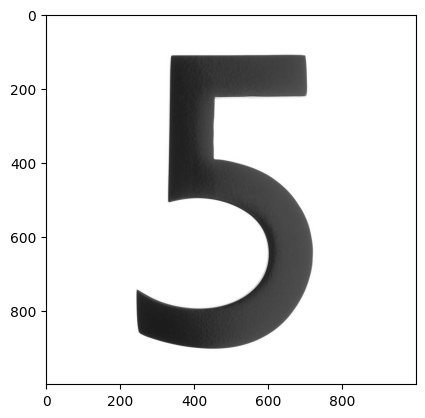

In [49]:
from PIL import Image
img = Image.open(response.raw)
plt.imshow(img)

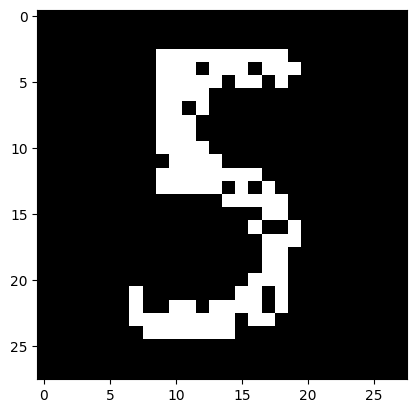

In [50]:
import PIL.ImageOps
img = PIL.ImageOps.invert(img)
img = img.convert('1')
transform = transforms.Compose([transforms.Resize((28,28)),transforms.ToTensor(),transforms.Normalize((0.5,), (0.5))])
img = transform(img)
plt.imshow(image_convert(img))

In [51]:
img = img.view(img.shape[0], -1)
new_output = model(img)
_, pred = torch.max(new_output, 1)
print(pred.item())

5


Convolutional Neural Networks

In [52]:
#Stride: the shift of the kernel matrix
#Receptive Field: Area of operation of kernel
#Pool: Used to reduce the feature size
import torch
from torchvision import datasets, transforms
#Clubs together all the transforms to be applied on the image.
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
transform = transforms.Compose([transforms.ToTensor(),
                                transforms.Normalize((0.5,), (0.5))])
training_dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transform)
valid_dataset = datasets.MNIST(root='./data', train=False, download=True, transform=transform)

In [53]:
#Defining a training loader
training_loader = torch.utils.data.DataLoader(dataset=training_dataset, batch_size=128, shuffle=True)
valid_loader = torch.utils.data.DataLoader(valid_dataset, batch_size=128, shuffle=False)
print("Device:", device)

Device: cuda:0


In [54]:
import torch.nn.functional as F
#LeNet architecture
class CNN_model(nn.Module):
  def __init__(self):
    super().__init__()
    #Conv2d(num_input_channel, num_output_channel, kernel_size, stride)
    self.conv1 = nn.Conv2d(1,20,5,1)
    self.conv2 = nn.Conv2d(20,50,5,1)
    self.fc1 = nn.Linear(in_features=4*4*50, out_features=500)
    self.dropout1 = nn.Dropout(0.5)
    self.fc2 = nn.Linear(in_features=500, out_features=10)

  def forward(self, x):
    x = F.relu(self.conv1(x))
    x = F.max_pool2d(x, 2, 2)
    x = F.relu(self.conv2(x))
    x = F.max_pool2d(x, 2, 2)
    x = x.view(-1,4*4*50)
    x = F.relu(self.fc1(x))
    x = self.dropout1(x)
    x = self.fc2(x)
    return x

In [55]:
model = CNN_model().to(device)
criteria = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
model

CNN_model(
  (conv1): Conv2d(1, 20, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(20, 50, kernel_size=(5, 5), stride=(1, 1))
  (fc1): Linear(in_features=800, out_features=500, bias=True)
  (dropout1): Dropout(p=0.5, inplace=False)
  (fc2): Linear(in_features=500, out_features=10, bias=True)
)

In [56]:
train_losses = []
train_accs = []
valid_losses = []
valid_accs = []
epochs = 15

for epoch in range(epochs):
  train_loss = 0.0
  train_acc = 0.0
  train_samples = 0
  val_loss = 0.0
  val_acc = 0.0
  val_samples = 0
  for train_images, train_labels in training_loader:
    #Shifting the tensors to GPU
    train_images = train_images.to(device)
    train_labels = train_labels.to(device)
    #Getting the model output
    train_output = model(train_images)
    #Computing the loss
    loss = criteria(train_output, train_labels)
    #Setting optimizer to zero grad
    optimizer.zero_grad()
    #Computing the gradient
    loss.backward()
    #Updating the parameters
    optimizer.step()
    #Computing metrics
    _, preds = torch.max(train_output, 1)
    train_acc += (preds==train_labels.data).sum().item()
    train_loss += loss.item()
    train_samples += train_labels.size(0)
  #Storing train metrics
  train_loss = train_loss/len(training_loader)
  train_acc = 100*train_acc/train_samples
  train_losses.append(train_loss)
  train_accs.append(train_acc)
  with torch.no_grad():
    for val_images, val_labels in valid_loader:
      #Shifting the tensors
      val_images = val_images.to(device)
      val_labels = val_labels.to(device)
      #Getting the model's output
      val_out = model(val_images)
      #Computing the loss
      loss = criteria(val_out, val_labels)
      _, val_preds = torch.max(val_out, 1)
      val_acc += (val_preds==val_labels).sum().item()
      val_loss += loss.item()
      val_samples += val_labels.size(0)
    #Stroing test metrics
    val_loss = val_loss/len(valid_loader)
    val_acc = 100*val_acc/val_samples
    valid_losses.append(val_loss)
    valid_accs.append(val_acc)

  if(epoch%1==0):
    print(f"Epoch: {epoch+1}/{epochs} | Training Loss: {train_loss:.5f} | Training Accuracy: {train_acc:.5f}% | Validation Loss: {val_loss:.5f} | Validation Accuracy: {val_acc:.5f}%")


Epoch: 1/15 | Training Loss: 0.20580 | Training Accuracy: 93.70500% | Validation Loss: 0.05897 | Validation Accuracy: 98.03000%
Epoch: 2/15 | Training Loss: 0.05896 | Training Accuracy: 98.22500% | Validation Loss: 0.04913 | Validation Accuracy: 98.31000%
Epoch: 3/15 | Training Loss: 0.04340 | Training Accuracy: 98.60833% | Validation Loss: 0.03286 | Validation Accuracy: 98.95000%
Epoch: 4/15 | Training Loss: 0.03397 | Training Accuracy: 98.96167% | Validation Loss: 0.03134 | Validation Accuracy: 98.91000%
Epoch: 5/15 | Training Loss: 0.02890 | Training Accuracy: 99.07167% | Validation Loss: 0.04260 | Validation Accuracy: 98.74000%
Epoch: 6/15 | Training Loss: 0.02386 | Training Accuracy: 99.26833% | Validation Loss: 0.03146 | Validation Accuracy: 98.96000%
Epoch: 7/15 | Training Loss: 0.01996 | Training Accuracy: 99.37000% | Validation Loss: 0.03258 | Validation Accuracy: 99.09000%
Epoch: 8/15 | Training Loss: 0.01714 | Training Accuracy: 99.44000% | Validation Loss: 0.02830 | Validat

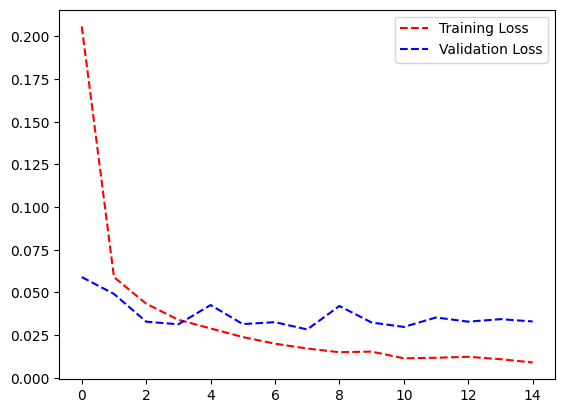

In [57]:
plt.plot(train_losses, 'r--', label="Training Loss")
plt.plot(valid_losses, 'b--', label="Validation Loss")
plt.legend()

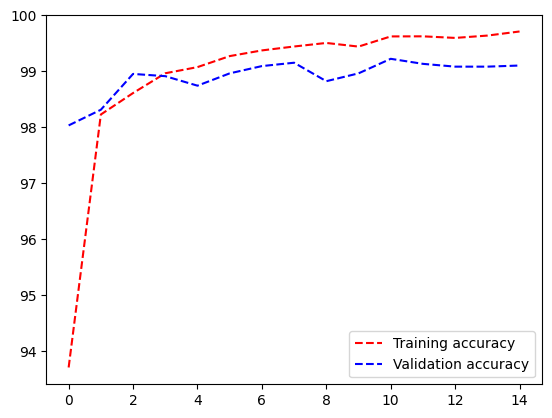

In [58]:
plt.plot(train_accs, 'r--', label="Training accuracy")
plt.plot(valid_accs, 'b--', label="Validation accuracy")
plt.legend()

In [59]:
transform_train = transforms.Compose([transforms.Resize((32,32)),
                                      transforms.RandomHorizontalFlip(),
                                      transforms.RandomRotation(10),
                                      transforms.RandomAffine(0, shear=10, scale=(0.8,1.2)),
                                      transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
                                      transforms.ToTensor(),
                                      transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))])
transform = transforms.Compose([transforms.Resize((32,32)),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))])
training_dataset = datasets.CIFAR10(root='./data2', train=True, download=True, transform=transform_train)
valid_dataset = datasets.CIFAR10(root='./data2', train=False, download=True, transform=transform)

train_loader = torch.utils.data.DataLoader(training_dataset, batch_size=128, shuffle=True)
val_loader = torch.utils.data.DataLoader(valid_dataset, batch_size=128, shuffle=False)

100%|██████████| 170498071/170498071 [00:01<00:00, 96660731.64it/s] 


Extracting ./data2/cifar-10-python.tar.gz to ./data2
Files already downloaded and verified


In [60]:
def image_convert(tns):
  #Creating a image
  image = tns.clone().detach().numpy()
  #Rearranging axis. This gives the shape 28x28x1
  image = image.transpose(1,2,0)
  #Denormalizing
  image = image*np.array((0.5,0.5,0.5)) + np.array((0.5,0.5,0.5))
  image = image.clip(0,1)
  return image

In [61]:
classes = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

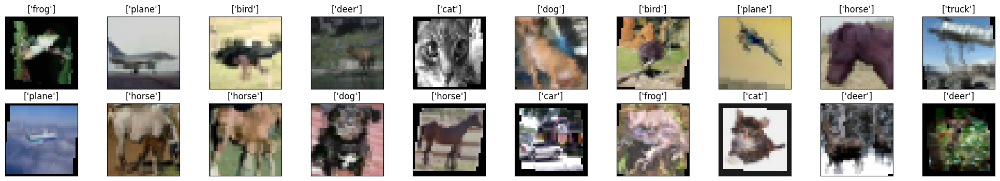

In [62]:
dataiter = iter(train_loader)
images, labels = next(dataiter)
fig = plt.figure(figsize=(25,4))

for i in range(20):
  ax = fig.add_subplot(2, 10, i+1, xticks=[], yticks=[])
  plt.imshow(image_convert(images[i]))
  ax.set_title([classes[labels[i].item()]])

In [63]:
import torch.nn.functional as F
#LeNet architecture
class CNN_model(nn.Module):
  def __init__(self):
    super().__init__()
    #Conv2d(num_input_channel, num_output_channel, kernel_size, stride)
    self.conv1 = nn.Conv2d(3,16,3,1,padding=1)
    self.conv2 = nn.Conv2d(16,32,3,1,padding=1)
    self.conv3 = nn.Conv2d(32,64,3,1,padding=1)
    self.fc1 = nn.Linear(in_features=4*4*64, out_features=500)
    self.dropout1 = nn.Dropout(0.5)
    self.fc2 = nn.Linear(in_features=500, out_features=10)

  def forward(self, x):
    x = F.relu(self.conv1(x))
    x = F.max_pool2d(x, 2, 2)
    x = F.relu(self.conv2(x))
    x = F.max_pool2d(x, 2, 2)
    x = F.relu(self.conv3(x))
    x = F.max_pool2d(x, 2, 2)
    x = x.view(-1,4*4*64)
    x = F.relu(self.fc1(x))
    x = self.dropout1(x)
    x = self.fc2(x)
    return x

In [64]:
model = CNN_model().to(device)
criteria = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
model

CNN_model(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (fc1): Linear(in_features=1024, out_features=500, bias=True)
  (dropout1): Dropout(p=0.5, inplace=False)
  (fc2): Linear(in_features=500, out_features=10, bias=True)
)

In [65]:
train_losses = []
train_accs = []
val_losses = []
val_accs = []
epochs = 15

for epoch in range(epochs):
  train_loss = 0.0
  train_acc = 0.0
  train_samples = 0

  valid_loss = 0.0
  valid_acc = 0.0
  valid_samples = 0
  for train_img, train_label in train_loader:
    #Shifting the tensors to GPU
    train_img = train_img.to(device)
    train_label = train_label.to(device)
    #Computing model output and loss
    train_out = model(train_img)
    loss = criteria(train_out, train_label)
    #Setting gradient to zero
    optimizer.zero_grad()
    #Computing the required gradients
    loss.backward()
    #Updating the model parameters
    optimizer.step()
    #Computing metrics
    _, preds = torch.max(train_out, 1)
    train_acc += (preds==train_label).sum().item()
    train_loss += loss.item()
    train_samples += train_label.size(0)

  train_loss = train_loss/len(train_loader)
  train_losses.append(train_loss)
  train_acc = 100*train_acc/train_samples
  train_accs.append(train_acc)

  with torch.no_grad():
    for val_images, val_labels in val_loader:
      val_images = val_images.to(device)
      val_labels = val_labels.to(device)
      val_out = model(val_images)
      loss = criteria(val_out, val_labels)
      _, val_preds = torch.max(val_out,1)
      val_acc+=(val_preds==val_labels).sum().item()
      val_loss += loss.item()
      valid_samples += val_labels.size(0)

    val_acc = 100*val_acc/valid_samples
    val_accs.append(val_acc)
    val_loss = val_loss/len(val_loader)
    val_losses.append(val_loss)

  if(epoch%1==0):
    print(f"Epoch: {epoch+1}/{epochs} | Training loss: {train_loss:.5f} | Training Accuracy: {train_acc:.4f}% | Validation Loss: {val_loss:.5f} | Validation Accuracy: {val_acc:.4f}%")

Epoch: 1/15 | Training loss: 1.71685 | Training Accuracy: 36.9140% | Validation Loss: 1.42363 | Validation Accuracy: 48.8510%
Epoch: 2/15 | Training loss: 1.40672 | Training Accuracy: 49.1460% | Validation Loss: 1.25555 | Validation Accuracy: 55.4585%
Epoch: 3/15 | Training loss: 1.27747 | Training Accuracy: 54.2980% | Validation Loss: 1.14566 | Validation Accuracy: 59.8146%
Epoch: 4/15 | Training loss: 1.18143 | Training Accuracy: 57.8260% | Validation Loss: 1.08795 | Validation Accuracy: 62.3081%
Epoch: 5/15 | Training loss: 1.10949 | Training Accuracy: 60.4300% | Validation Loss: 1.03006 | Validation Accuracy: 64.5731%
Epoch: 6/15 | Training loss: 1.06755 | Training Accuracy: 62.2700% | Validation Loss: 0.98215 | Validation Accuracy: 66.0957%
Epoch: 7/15 | Training loss: 1.03335 | Training Accuracy: 63.5300% | Validation Loss: 0.94053 | Validation Accuracy: 68.3810%
Epoch: 8/15 | Training loss: 0.98788 | Training Accuracy: 65.1720% | Validation Loss: 0.92344 | Validation Accuracy: 6

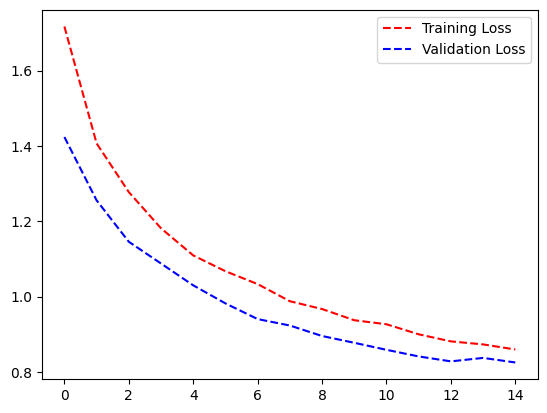

In [66]:
plt.plot(train_losses, 'r--', label="Training Loss")
plt.plot(val_losses, 'b--', label="Validation Loss")
plt.legend()

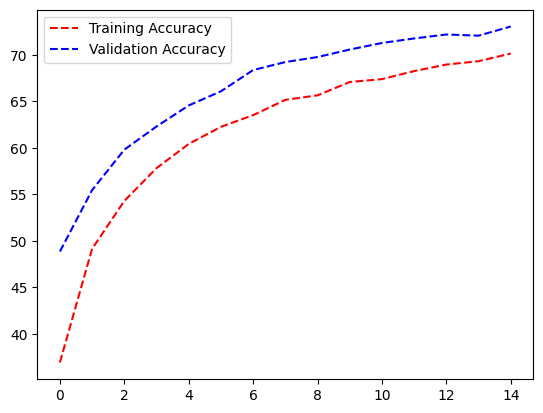

In [67]:
plt.plot(train_accs, 'r--', label="Training Accuracy")
plt.plot(val_accs, 'b--', label="Validation Accuracy")
plt.legend()

Transfer Learning

In [68]:
import numpy as np
import torch
import torch.nn.functional as F
import torch.nn as nn
from torchvision import datasets, transforms, models

In [69]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [70]:
!git clone https://github.com/jaddoescad/ants_and_bees.git

Cloning into 'ants_and_bees'...
remote: Enumerating objects: 408, done.
remote: Total 408 (delta 0), reused 0 (delta 0), pack-reused 408
Receiving objects: 100% (408/408), 45.03 MiB | 44.00 MiB/s, done.
Resolving deltas: 100% (2/2), done.


In [71]:
train_transform = transforms.Compose([transforms.Resize((224,224)),
                                      transforms.RandomHorizontalFlip(),
                                      transforms.RandomAffine(0, shear=10, scale=(0.8,1.2)),
                                      transforms.ColorJitter(brightness=1, contrast=1, saturation=1),
                                      transforms.ToTensor(),
                                      transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))])
transform = transforms.Compose([transforms.Resize((224,224)),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))])

train_dataset = datasets.ImageFolder("ants_and_bees/train", transform=train_transform)
val_dataset = datasets.ImageFolder("ants_and_bees/val", transform=transform)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=20, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=20, shuffle=False)

In [72]:
classes = ('ant', 'bee')

In [73]:
def image_convert(tns):
  #Creating a image
  image = tns.clone().detach().numpy()
  #Rearranging axis. This gives the shape 28x28x1
  image = image.transpose(1,2,0)
  #Denormalizing
  image = image*np.array((0.5,0.5,0.5)) + np.array((0.5,0.5,0.5))
  image = image.clip(0,1)
  return image

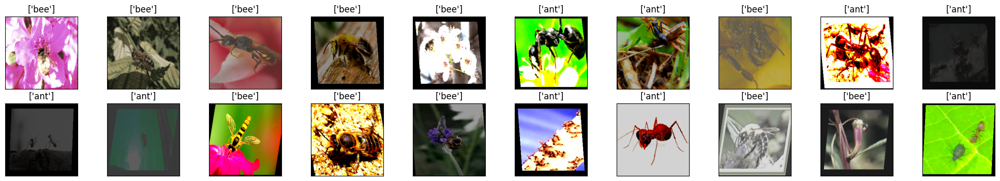

In [74]:
dataiter = iter(train_loader)
images, labels = next(dataiter)
fig = plt.figure(figsize=(25,4))

for i in range(20):
  ax = fig.add_subplot(2, 10, i+1, xticks=[], yticks=[])
  plt.imshow(image_convert(images[i]))
  ax.set_title([classes[labels[i].item()]])

In [75]:
#model = models.alexnet(pretrained=True)
model = models.vgg16(pretrained=True)
model

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 197MB/s]


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [76]:
for param in model.features.parameters():
  param.requires_grad = False

In [77]:
n_inputs = model.classifier[6].in_features
last_layer = nn.Linear(n_inputs, len(classes))
model.classifier[6] = last_layer
model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [78]:
model.to(device)
criteria = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)

In [79]:
train_losses = []
train_accs = []
val_losses = []
val_accs = []
epochs = 5
for epoch in range(epochs):
  train_loss = 0.0
  train_acc = 0.0
  val_loss = 0.0
  val_acc = 0.0
  for train_img, train_label in train_loader:
    #Loading the tensors to GPU
    train_img = train_img.to(device)
    train_label = train_label.to(device)
    #Getting the model output and computing the loss
    train_out = model(train_img)
    loss = criteria(train_out, train_label)
    #Setting the grad to zero, computing the gradient and updating the loss
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    #Computing metrics
    _, pred = torch.max(train_out, 1)
    train_acc += (pred==train_label).sum().item()
    train_loss += loss.item()
  train_loss = train_loss/(len(train_loader.dataset))
  train_losses.append(train_loss)
  train_acc = 100*train_acc/(len(train_loader.dataset))
  train_accs.append(train_acc)
  with torch.no_grad():
    for val_image, val_label in val_loader:
      val_image = val_image.to(device)
      val_label = val_label.to(device)
      val_out = model(val_image)
      loss = criteria(val_out, val_label)
      _, preds = torch.max(val_out, 1)
      val_acc += (preds==val_label).sum().item()
      val_loss += loss.item()
    val_loss = val_loss/(len(val_loader.dataset))
    val_losses.append(val_loss)
    val_acc = 100*val_acc/(len(val_loader.dataset))
    val_accs.append(val_acc)
  if(epoch%1==0):
    print(f"Epoch: {epoch+1}/{epochs} | Training Loss: {train_loss:.5f} | Training Accuracy: {train_acc:.4f}% | Validation Loss: {val_loss:.5f} | Validation Accuracy: {val_acc:.4f}%")

Epoch: 1/5 | Training Loss: 0.02896 | Training Accuracy: 67.6230% | Validation Loss: 0.01365 | Validation Accuracy: 90.1961%
Epoch: 2/5 | Training Loss: 0.02003 | Training Accuracy: 84.8361% | Validation Loss: 0.01423 | Validation Accuracy: 92.1569%
Epoch: 3/5 | Training Loss: 0.01668 | Training Accuracy: 86.0656% | Validation Loss: 0.01564 | Validation Accuracy: 90.8497%
Epoch: 4/5 | Training Loss: 0.01311 | Training Accuracy: 88.1148% | Validation Loss: 0.01766 | Validation Accuracy: 90.8497%
Epoch: 5/5 | Training Loss: 0.01668 | Training Accuracy: 88.9344% | Validation Loss: 0.01546 | Validation Accuracy: 92.8105%


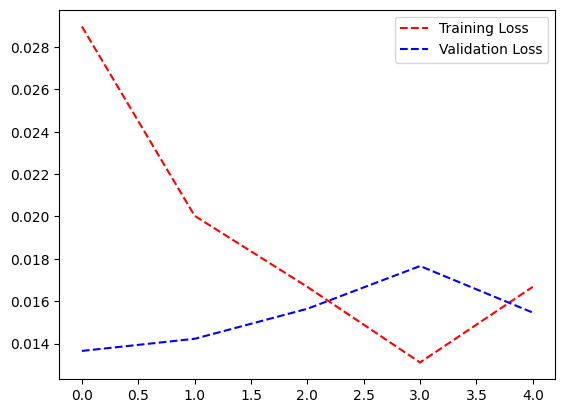

In [80]:
plt.plot(train_losses, "r--", label="Training Loss")
plt.plot(val_losses, "b--", label="Validation Loss")
plt.legend()

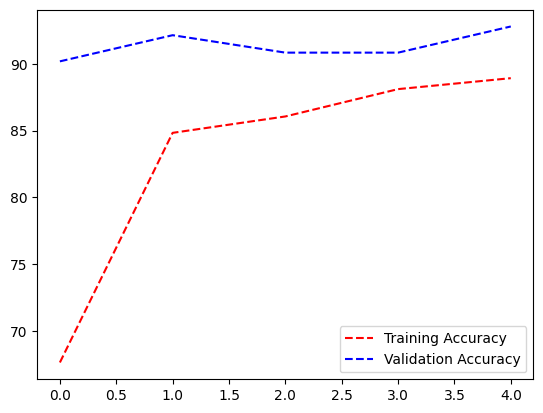

In [81]:
plt.plot(train_accs, "r--", label="Training Accuracy")
plt.plot(val_accs, "b--", label="Validation Accuracy")
plt.legend()

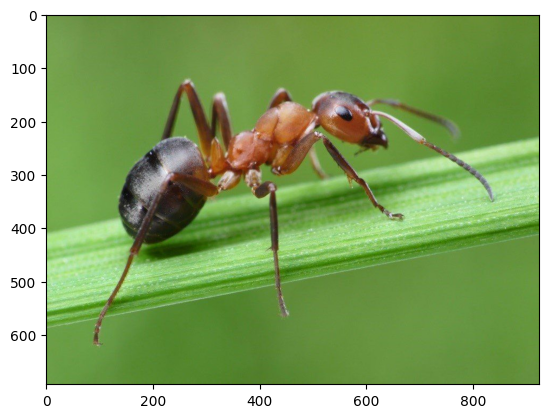

In [82]:
import requests
from PIL import Image
#url = "https://i0.wp.com/www.honeybeesuite.com/wp-content/uploads/2011/03/David-Cappaert-3.jpg?fit=810%2C665&ssl=1"
url = "https://lirp.cdn-website.com/99af0f3d/dms3rep/multi/opt/s-1920w.jpg"
response = requests.get(url, stream=True)
img = Image.open(response.raw)
plt.imshow(img)

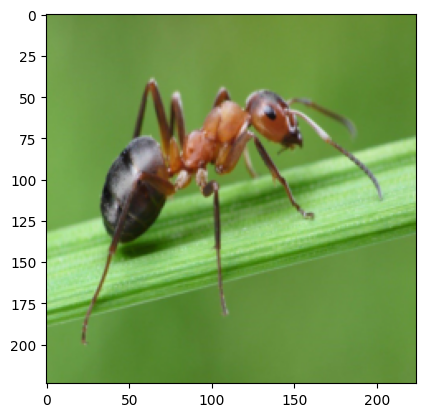

In [83]:
import PIL.ImageOps
transform = transforms.Compose([transforms.Resize((224,224)),transforms.ToTensor(),transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))])
img = transform(img)
plt.imshow(image_convert(img))

In [84]:
img = img.to(device).unsqueeze(0)
new_output = model(img)
_, pred = torch.max(new_output, 1)
print(classes[pred.item()])

ant


Style Transfer

In [85]:
%matplotlib inline
import torch
import torch.optim as optim
from torchvision import transforms, models
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

In [86]:
vgg = models.vgg19(pretrained=True).features

for param in vgg.parameters():
  param.requires_grad_(False)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
vgg.to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:02<00:00, 254MB/s]


Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

In [87]:
def load_image(img_path, max_size=400, shape=None):
  image = Image.open(img_path).convert('RGB')
  if(max(image.size)>max_size):
    size = max_size
  else:
    size = max(image.size)
  if(shape is not None):
    size = shape
  in_transform = transforms.Compose([transforms.Resize(size),
                                 transforms.ToTensor(),
                                 transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))])
  image = in_transform(image).unsqueeze(0)
  return image

In [88]:
content = load_image("City.jpg").to(device)
style = load_image("StarryNight.jpg", shape=content.shape[-2:]).to(device)

In [89]:
def image_convert(tns):
  #Creating a image
  image = tns.cpu().clone().detach().numpy()
  #Rearranging axis. This gives the shape 28x28x1
  image = image.squeeze()
  image = image.transpose(1,2,0)
  #Denormalizing
  image = image*np.array((0.5,0.5,0.5)) + np.array((0.5,0.5,0.5))
  image = image.clip(0,1)
  return image

(-0.5, 599.5, 399.5, -0.5)

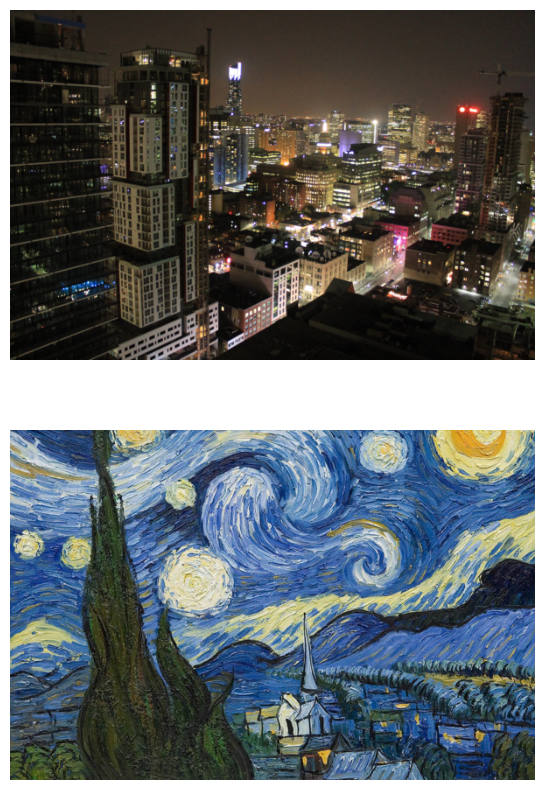

In [90]:
fig, ax = plt.subplots(2,1,figsize=(20,10))
ax[0].imshow(image_convert(content))
ax[0].axis('off')
ax[1].imshow(image_convert(style))
ax[1].axis('off')

In [91]:
def get_features(image, model):

  layers = {'0': 'conv1_1',
            '5': 'conv2_1',
            '10': 'conv3_1',
            '19': 'conv4_1',
            '21': 'conv4_2', #Used for content extraction
            '28': 'conv5_1'}
  features = {}

  for name, layer in model._modules.items():
    image = layer(image)
    if(name in layers):
      features[layers[name]] = image

  return features

In [92]:
content_features = get_features(content, vgg)
style_features = get_features(style, vgg)

In [93]:
def gram_matrix(tens):
  #Batch size, image depth, image height, image width
  _, d, h, w = tens.size()
  tens = tens.view(d, h*w)
  gram = torch.mm(tens, tens.t())
  return gram

In [94]:
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

In [95]:
style_weights = {'conv1_1':1,
                 'conv2_1':0.75,
                 'conv3_1':0.2,
                 'conv4_1':0.2,
                 'conv5_1':0.2}

content_weight = 1 #alpha
style_weight = 1e6 #beta
#The alpha/beta ratio dictates the amount of style and amount of content image

In [96]:
target = content.clone().requires_grad_(True).to(device)

In [97]:
#Shows an updated image every 300 iterations
show_every = 1000
#Defining optimizer
optimizer = optim.Adam([target], lr=0.003)
#Defining the steps
steps =  18000
height, width, channels = image_convert(target).shape
#To save the frame as image
image_array = np.empty(shape=(1000, height, width, channels))
#Captures frame every so often
capture_frame = steps/1000
counter = 0

Iterations: 1 | Total Loss: 91290968.0 | Progress: 0.0000%


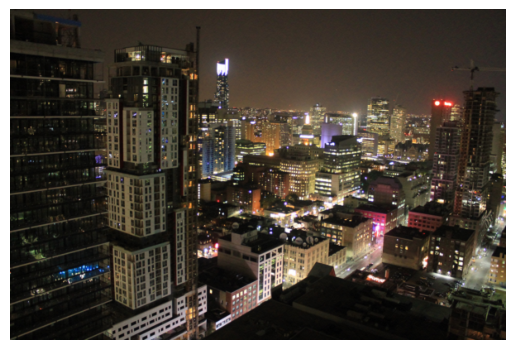

Iterations: 1001 | Total Loss: 595749.5625 | Progress: 5.5556%


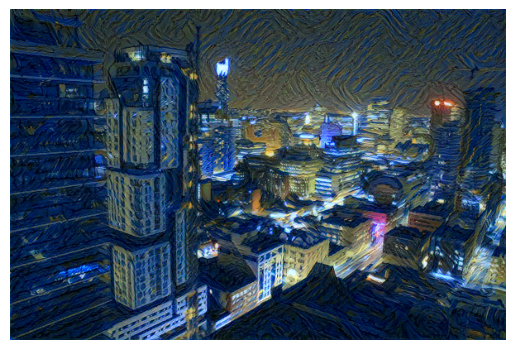

Iterations: 2001 | Total Loss: 262910.96875 | Progress: 11.1111%


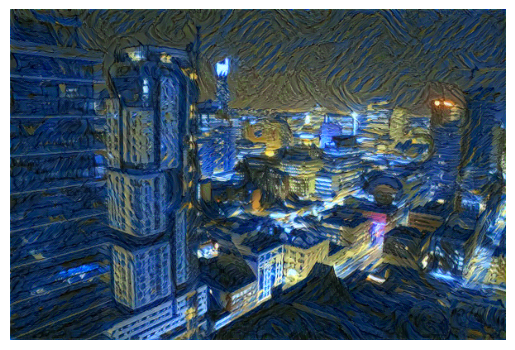

Iterations: 3001 | Total Loss: 112222.2890625 | Progress: 16.6667%


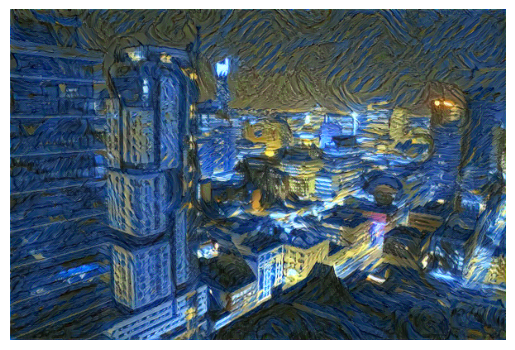

Iterations: 4001 | Total Loss: 47446.30859375 | Progress: 22.2222%


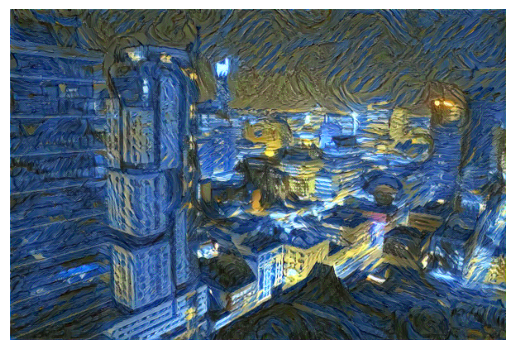

Iterations: 5001 | Total Loss: 24176.34375 | Progress: 27.7778%


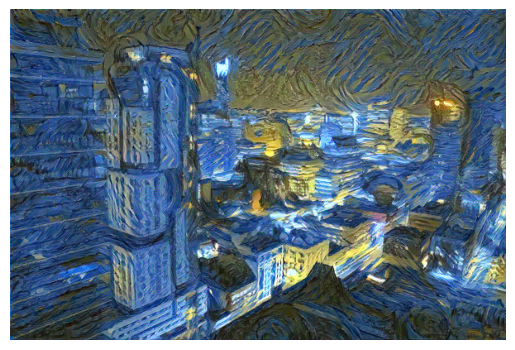

Iterations: 6001 | Total Loss: 16335.7587890625 | Progress: 33.3333%


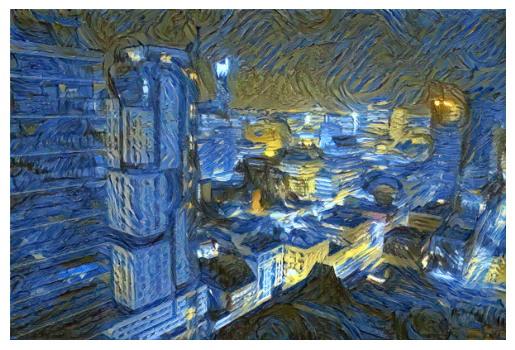

Iterations: 7001 | Total Loss: 13083.9130859375 | Progress: 38.8889%


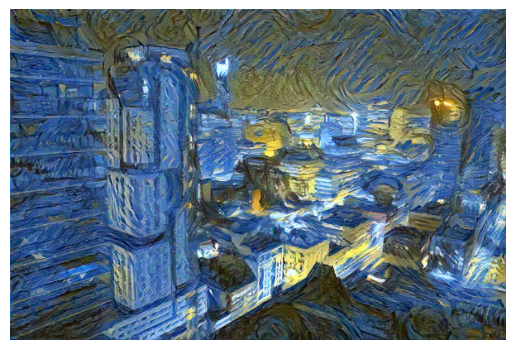

Iterations: 8001 | Total Loss: 12418.7685546875 | Progress: 44.4444%


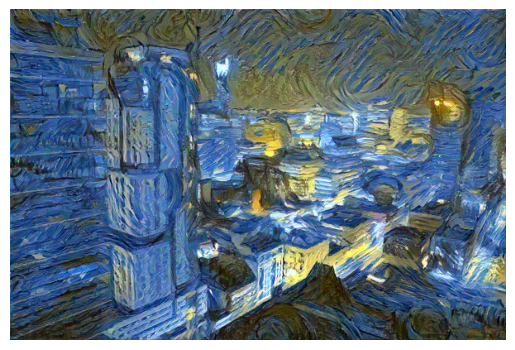

Iterations: 9001 | Total Loss: 10664.1708984375 | Progress: 50.0000%


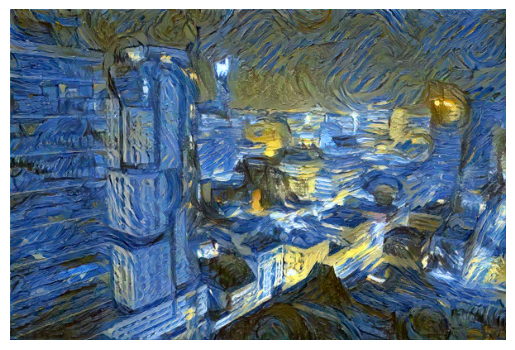

Iterations: 10001 | Total Loss: 10015.5810546875 | Progress: 55.5556%


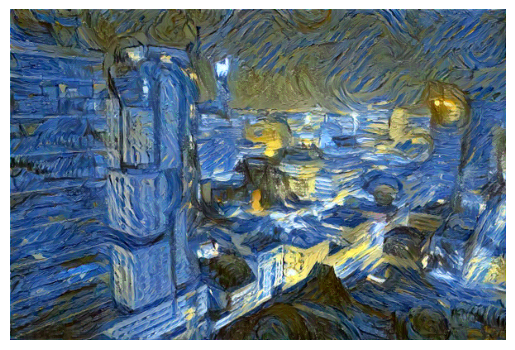

Iterations: 11001 | Total Loss: 9463.8876953125 | Progress: 61.1111%


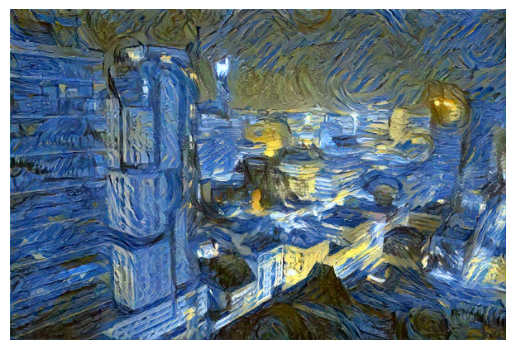

Iterations: 12001 | Total Loss: 9453.232421875 | Progress: 66.6667%


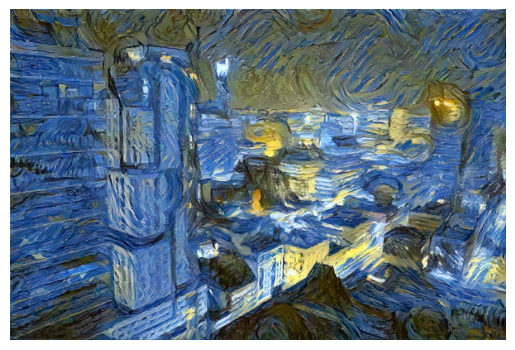

Iterations: 13001 | Total Loss: 8674.4560546875 | Progress: 72.2222%


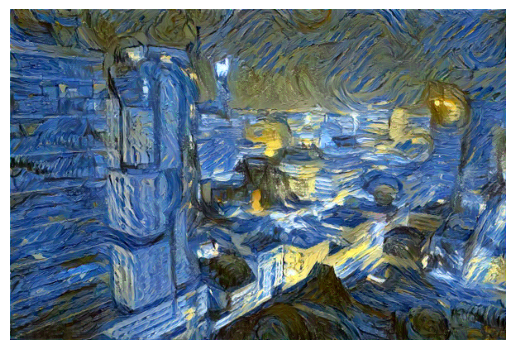

Iterations: 14001 | Total Loss: 8329.919921875 | Progress: 77.7778%


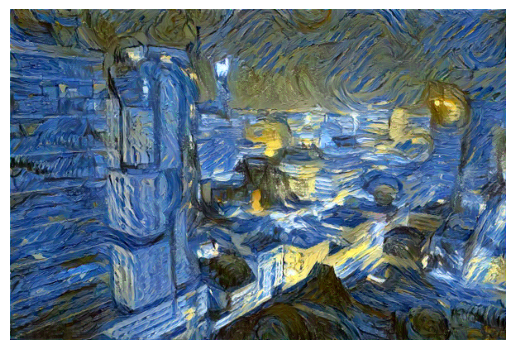

Iterations: 15001 | Total Loss: 8011.21484375 | Progress: 83.3333%


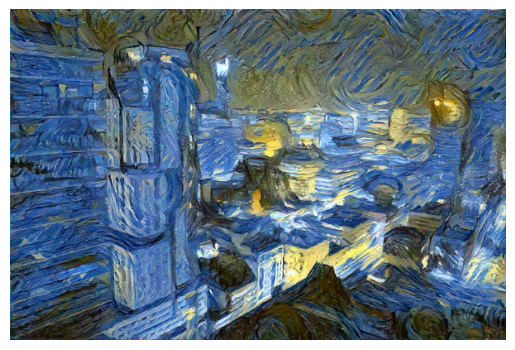

Iterations: 16001 | Total Loss: 7959.361328125 | Progress: 88.8889%


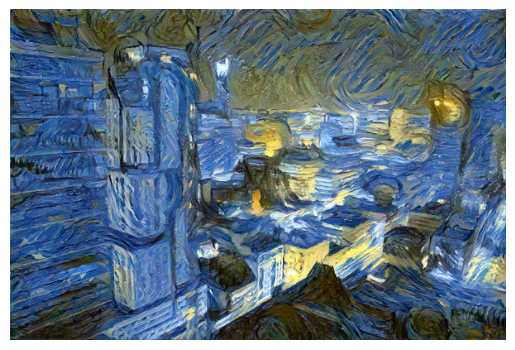

Iterations: 17001 | Total Loss: 7793.080078125 | Progress: 94.4444%


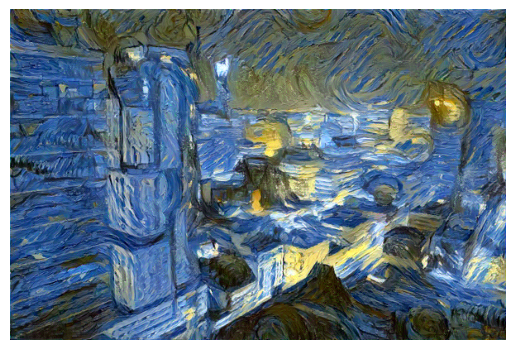

In [98]:
for ii in range(0,steps):
  target_features = get_features(target, vgg)

  #Computing the content loss
  content_loss = torch.mean((target_features['conv4_2']-content_features['conv4_2'])**2)
  style_loss = 0.0

  #Computing the style loss
  for layer in style_weights:
    target_feature = target_features[layer]
    target_gram = gram_matrix(target_feature)
    style_gram = style_grams[layer]
    layer_style_loss = style_weights[layer]*torch.mean((target_gram-style_gram)**2)
    _, d, h, w = target_feature.shape
    style_loss += layer_style_loss/(d*h*w)

  total_loss = content_loss*content_weight + style_loss*style_weight

  #Setting gradients to zero
  optimizer.zero_grad()
  #Computing the loss
  total_loss.backward()
  #Updating the target image
  optimizer.step()

  if(ii%show_every==0):
    print(f"Iterations: {ii+1} | Total Loss: {total_loss.item()} | Progress: {ii*100/steps:.4f}%")
    plt.imshow(image_convert(target))
    plt.axis('off')
    plt.show()

  if(ii%capture_frame==0):
    image_array[counter] = image_convert(target)
    counter+=1

In [100]:
import cv2
frame_height, frame_width, _ = image_convert(target).shape
vid = cv2.VideoWriter("CityByVanGogh.mp4", cv2.VideoWriter_fourcc(*"XVID"), 30, (frame_width, frame_height))

for i in range(0, 300):
  img = image_array[i]
  img = img*255
  img = np.array(img, dtype=np.uint8)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  vid.write(img)

vid.release()